# H1C IDR3 Validation LST-Binning Inspection Notebook: All Epochs
### Josh Dillon

This notebook provides a sense-check for the final H1C IDR3 LST-binning results.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from hera_cal.io import HERAData
import glob
from hera_cal import utils, noise, redcal, lstbin
from hera_cal.abscal import match_times
from copy import deepcopy
import os
from IPython.display import display, HTML
import warnings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
display(HTML("<style>.container { width:100% !important; }</style>"))

In [2]:
# figure out the correct order of files, based on a split at 4.71 radians
def file_lst_for_sort(fn):
    lst = float(fn.split('.LST.')[-1].split('.sum.')[0]) - 4.71
    if lst < 0:
        lst += 2 * np.pi
    return lst

In [3]:
epoch_files = {epoch: sorted(glob.glob(f'/lustre/aoc/projects/hera/Validation/test-4.1.0/LSTBIN/epoch_{epoch}/preprocess/zen.grp1.of1.LST.*.sum.P.uvh5'), 
                             key=file_lst_for_sort) for epoch in range(4)}
all_epochs_files = sorted(glob.glob('/lustre/aoc/projects/hera/Validation/test-4.1.0/LSTBIN/all_epochs_preprocessed/zen.grp1.of1.LST.*.sum.LPL.uvh5'), key=file_lst_for_sort)

In [4]:
example_all_epochs_file = all_epochs_files[39] # LST with most overlap
hd = HERAData(example_all_epochs_file)
print(f'Comparing at {np.mean(hd.lsts)*12/np.pi} hours LST.')
data, flags, nsamples = hd.read()

antenna_diameters is not set. Using known values for HERA.


Comparing at 8.171485543374436 hours LST.


antenna_diameters is not set. Using known values for HERA.
Fixing auto-correlations to be be real-only, after some imaginary values were detected in data_array.


In [5]:
# figure out which antenna numbers have more than 0 samples
ants_with_samples = set([])
for bl in nsamples:
    sample_sum = np.sum(nsamples[bl])
    if sample_sum > 0:
        for ant in utils.split_bl(bl):
            ants_with_samples.add(ant[0])

In [6]:
def Array_Plot():
    plt.figure(figsize=(8, 8), dpi=75)
    plt.scatter(np.array([hd.antpos[ant][0] for ant in hd.data_ants]), 
                np.array([hd.antpos[ant][1] for ant in hd.data_ants]), c='w', s=0)
    for ant in hd.data_ants:
        pos = hd.antpos[ant]        
        bad = ant not in ants_with_samples
        plt.gca().add_artist(plt.Circle(tuple(pos[0:2]), radius=7, 
                                        fill=(~bad), color=['grey','r'][bad]))
        plt.text(pos[0],pos[1], str(ant), va='center', ha='center', color='w')
    plt.xlabel("Antenna East-West Position (meters)")
    plt.ylabel("Antenna North-South Position (meters)")
    plt.title(f'Antenna Positions for All Epochs at LST = {np.mean(data.lsts * 12 / np.pi):.2f} hours (Flags in Red)');
    plt.axis('equal')
    plt.tight_layout()

# Figure 1: Array Configuration and Flagged Antennas

This plot shows the array configuration in the example file, including flagged antennas (those involved in no baselines with any samples).

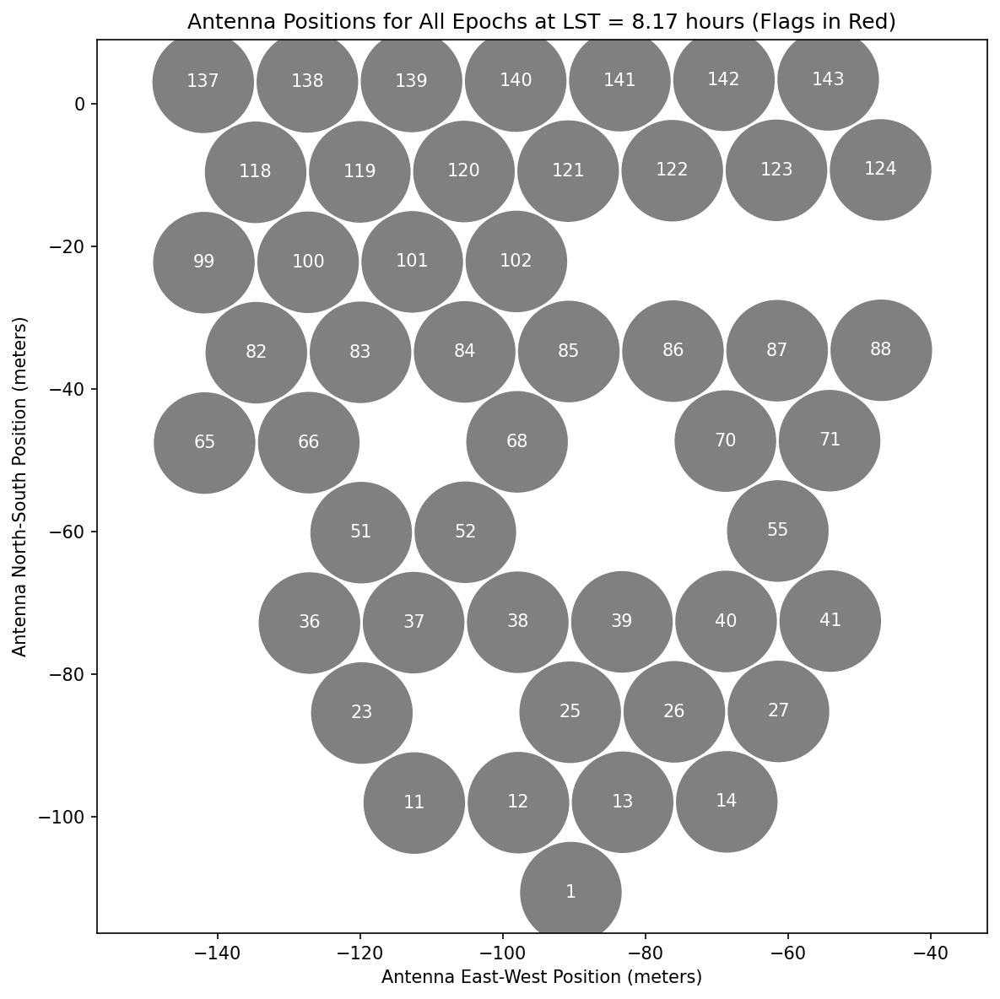

In [7]:
Array_Plot()

In [8]:
# get largest redundant groups over 40 m (so we get to see some fringes)
reds = redcal.get_reds({ant: hd.antpos[ant] for ant in hd.data_ants}, pols=['ee'])
ex_bls=set([bl for bl in nsamples if np.sum(nsamples[bl]) == 0])
reds = redcal.filter_reds(reds, bls=hd.bls, ex_bls=ex_bls, antpos=hd.antpos, min_bl_cut=40)
reds = sorted(reds, key=len, reverse=True)

# pick out baseline with most samples in 'ee'
bls_to_compare = [sorted(reds[0], key=lambda bl: np.sum(nsamples[bl]))[-1]]

In [9]:
epoch_d, epoch_f, epoch_n = {}, {}, {}
for epoch in range(4):
    try:
        equivalent_epoch_file = example_all_epochs_file.replace('/all_epochs/', f'/epoch_{epoch}/')
        hd2 = HERAData(equivalent_epoch_file)
        epoch_d[epoch], epoch_f[epoch], epoch_n[epoch] = hd2.read(bls=bls_to_compare, axis='blt')
    except:
        print(f'Cannot find {equivalent_epoch_file}')

antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.
antenna_diameters is not set. Using known values for HERA.


In [10]:
bl = bls_to_compare[0]
vmax = np.nanmax([np.where(epoch_f[epoch][bl], np.nan, np.abs(epoch_d[epoch][bl])) for epoch in range(4)] 
                       + [np.where(flags[bl], np.nan, np.abs(data[bl]))])
vmax

125.73038229174452

In [25]:
def Compare_To_Night():
    for bl in bls_to_compare:
        display(HTML(f'<h2>Baseline {bl}:</h2>'))
        fig, axes = plt.subplots(5, 4, figsize=(18,18))
        
        vmax = np.nanmax([np.where(epoch_f[epoch][bl], np.nan, np.abs(epoch_d[epoch][bl])) for epoch in range(4)] 
                         + [np.where(flags[bl], np.nan, np.abs(data[bl]))])
        
        extent=[data.freqs[0]/1e6, data.freqs[-1]/1e6, data.lsts[-1]*12/np.pi, data.lsts[0]*12/np.pi]
        
        for i, epoch in enumerate([0, 1, 2, 3, 'All']):
            if epoch == 'All':
                d, f, n = data, flags, nsamples
            else:
                d, f, n = epoch_d[epoch], epoch_f[epoch], epoch_n[epoch]
        
            im = axes[i, 0].imshow(np.where(f[bl], np.nan, np.angle(d[bl])), aspect='auto', cmap='twilight', extent=extent, interpolation='none')
            axes[i, 0].set_title(f'{bl}: Epoch {epoch} LST-Binned Phase')
            axes[i, 0].set_xlabel('Frequency (MHz)')
            axes[i, 0].set_ylabel('LST (Hours)')
            fig.colorbar(im, ax=axes[i, 0], label='Phase (radians)')
            
            im = axes[i, 1].imshow(np.where(f[bl], np.nan, np.abs(d[bl])), aspect='auto', cmap='inferno', vmin=0, vmax=vmax, extent=extent, interpolation='none')
            axes[i, 1].set_title(f'{bl}: Epoch {epoch} LST-Binned Amplitude')
            axes[i, 1].set_xlabel('Frequency (MHz)')
            axes[i, 1].set_ylabel('LST (Hours)')        
            fig.colorbar(im, ax=axes[i, 1], label='Amplitude (Jy)')
            
            im = axes[i, 2].imshow(np.abs(np.where(f[bl], np.nan, d[bl]) - np.where(flags[bl], np.nan, data[bl])), 
                                   aspect='auto', cmap='inferno', vmin=0, vmax=vmax/10, extent=extent, interpolation='none')
            axes[i, 2].set_title(f'{bl}: |Epoch {epoch} - All Epochs|')
            axes[i, 2].set_xlabel('Frequency (MHz)')
            axes[i, 2].set_ylabel('LST (Hours)')        
            fig.colorbar(im, ax=axes[i, 2], label='Amplitude of Difference (Jy)')              
            
            im = axes[i, 3].imshow(np.where(f[bl], 0, n[bl]), aspect='auto', cmap='viridis', vmin=0, extent=extent, interpolation='none')
            axes[i, 3].set_title(f'{bl}: Epoch {epoch} ' + '$N_{samples}$')
            axes[i, 3].set_xlabel('Frequency (MHz)')
            axes[i, 3].set_ylabel('LST (Hours)')        
            fig.colorbar(im, ax=axes[i, 3], label='$N_{samples}$')               
        
        plt.tight_layout()
        plt.show()
        display(HTML('<hr style="height:3px">'))

# Figure 2: Compare Each Epoch to the LST-Binning of All Epochs

Compares amplitude, phase, magnitude of visibility difference, and $N_{samples}$ of each epoch to the full stack.

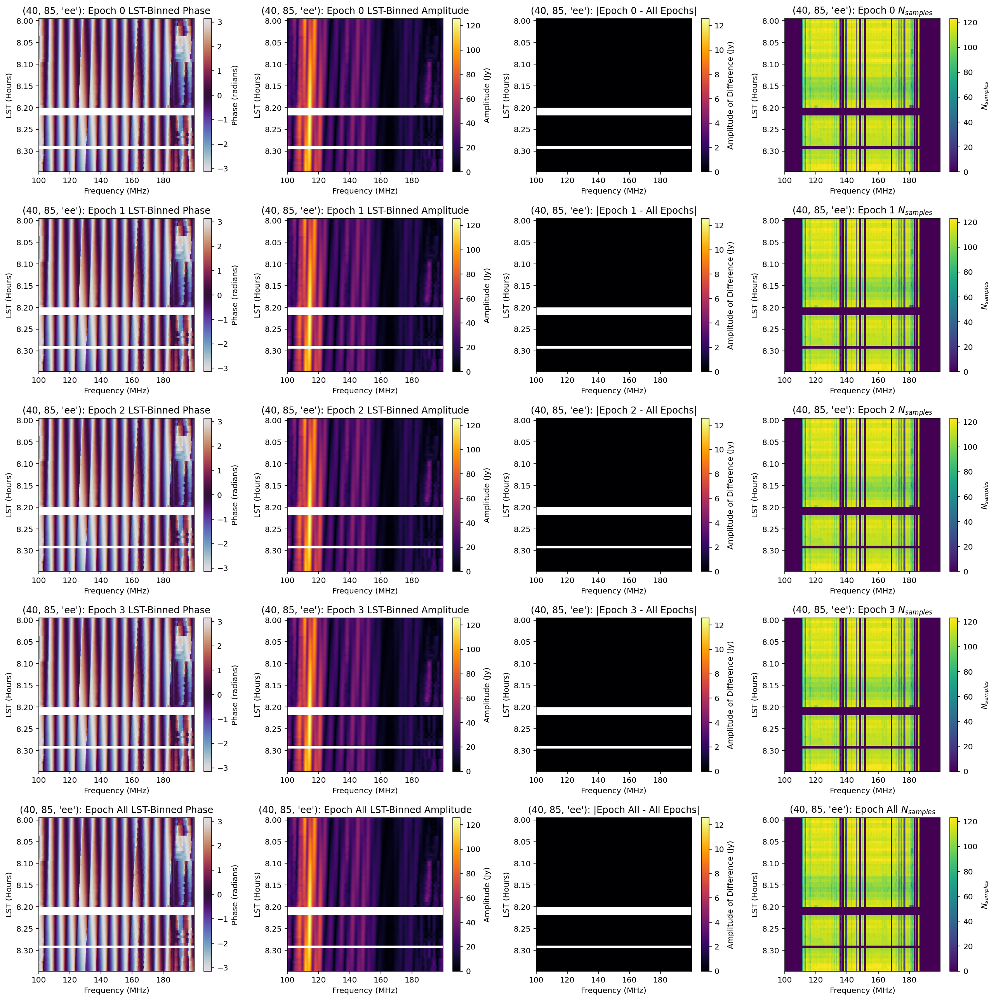

In [26]:
Compare_To_Night()

In [13]:
# get original integration time
tint = np.median(np.diff(HERAData('/lustre/aoc/projects/hera/Validation/test-4.1.0/2458041/zen.2458041.12552.sum.autos.uvh5').times)) * 24 * 3600

In [14]:
# lists to store estimates of the nosie variance in the LST-binned data products
all_interleaved_var = []
all_predicted_binned_var = []

# Loop over baselines
for bl in data.bls():
    ant1, ant2 = utils.split_bl(bl)
    auto1 = utils.join_bl(ant1, ant1)
    auto2 = utils.join_bl(ant2, ant2)    
    if ant1[1] != ant2[1]:
        continue # cross polarized
    if auto1 == auto2:
        continue # ignore autocorrelations in assessing noise
    
    # Flag integrations with fewer than 30 samples
    flags_here = deepcopy(flags[bl])
    flags_here |= flags[auto1] | flags[auto2]
    flags_here |= (nsamples[bl] < 30) | (nsamples[auto1] < 30) | (nsamples[auto2] < 30)
   
    # Predicted visibiltiy variance after LST-binning
    predicted_binned_var = noise.predict_noise_variance_from_autos(bl, data, dt=tint, nsamples=nsamples)
    predicted_binned_var[flags_here] = np.nan
    all_predicted_binned_var.append(predicted_binned_var)    
    
    # Observed visibiltiy variance after LST-binning
    data_here = deepcopy(data[bl])
    data_here[flags_here] = np.nan
    interleaved_variance = noise.interleaved_noise_variance_estimate(data_here, kernel=[[-.5,1,-.5]])
    all_interleaved_var.append(interleaved_variance)

divide by zero encountered in true_divide
invalid value encountered in true_divide


In [15]:
# average all visibiltiy variances over times and unflagged antennas
mean_interleaved_var = np.nanmean(np.abs(all_interleaved_var), axis=(0,1))
mean_predicted_binned_var = np.nanmean(all_predicted_binned_var, axis=(0,1))

Mean of empty slice
Mean of empty slice


In [16]:
def Noise_Comparison():
    fig, ax = plt.subplots(2,1, figsize=(16,8), sharex='col', gridspec_kw={'height_ratios': [2, 1]})
    plt.subplots_adjust(hspace=.0)
#     ax=ax.flatten()

    ax[0].plot(hd.freqs/1e6, mean_interleaved_var, lw=2, label='Variance from Frequency-Interleaving\nof LST-Binned Data')
    ax[0].plot(hd.freqs/1e6, mean_predicted_binned_var, lw=1, label='Predicted Variance from LST-Binned\nAutocorrelations and N$_{samples}$')
    ax[0].set_ylabel('LST-Binned Visibility Variance (Jy$^2$)')
    ax[0].set_title(f'Variance of LST-Binned Visibilities at {np.round(hd.lsts[0]*12/np.pi,3)}—{np.round(hd.lsts[-1]*12/np.pi,3)} Hours LST'
                    '\n(Mean Over Unflagged Times and Baselines)')
    ax[0].legend()

    ax[1].plot(hd.freqs/1e6, mean_interleaved_var/mean_predicted_binned_var, 'k-', lw=1)
    favg_rat =  np.nanmean(mean_interleaved_var/mean_predicted_binned_var)
    ax[1].plot(hd.freqs/1e6, np.ones_like(hd.freqs) * favg_rat, '--', c='grey', label=f'Frequency-Averaged Ratio: {favg_rat:.3f}')
    ax[1].set_xlabel('Frequency (MHz)')
    ax[1].set_ylim([.9, 1.5])
    ax[1].set_xlim([100,200])
    ax[1].set_ylabel('Observed / Predicted')
    ax[1].legend(loc='upper right')

    plt.tight_layout()

# Figure 3: Comparison of Noise Metrics and Predicted Noise

Comparison of noise predicted from autocorrelations and $N_{samples}$ to the noise measured from frequency-interleaving.

Based on [Validation Test 4.0.0b](https://github.com/HERA-Team/hera-validation/blob/master/test-series/4/test-4.0.0b.ipynb) and [Aguirre et al. (2021) Figure 12](https://www.overleaf.com/project/5e7cdde364f7d40001749218) (the H1C IDR2 Validation paper).

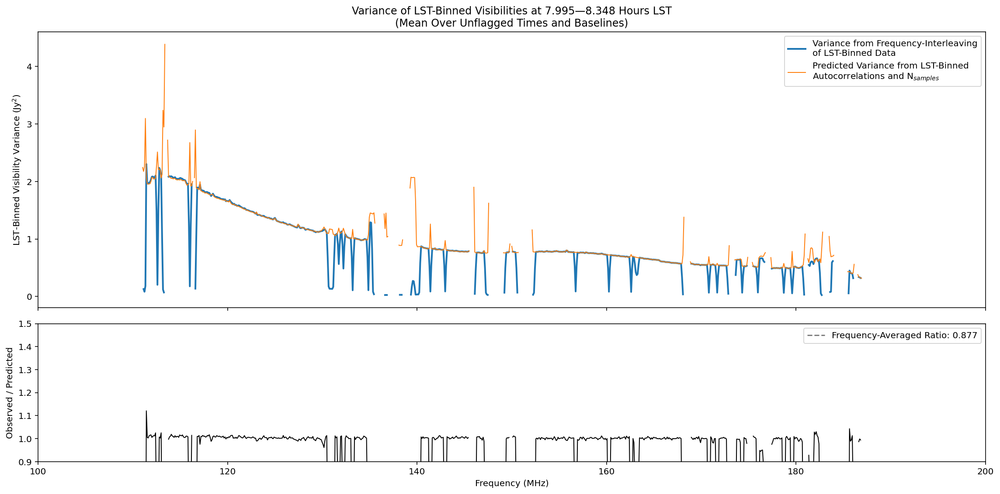

In [17]:
Noise_Comparison()

In [18]:
# pick out the baselines in the same groups but only pick the ones with the most total samples from the central file
bls_to_load = [sorted(reds[0], key=lambda bl: np.sum(nsamples[bl]))[-1]]
bls_to_load.append(bls_to_load[0][0:2] + ('nn',))

In [19]:
# Load those baselines for all LSTs
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    hd_full = HERAData(all_epochs_files)
    data_full, flags_full, nsamples_full = hd_full.read(bls=bls_to_load, axis='blt')

In [28]:
def Plot_Full_Season():
    for bl in bls_to_load:
        display(HTML(f'<h2>Baseline {bl}:</h2>'))
        plt.figure(figsize=(14,10), dpi=100)
        
        # handle possible wraps in LST
        extent=[data_full.freqs[0]/1e6, data_full.freqs[-1]/1e6, len(data_full.lsts), 0]
        yticks = np.linspace(0, len(data_full.lsts) - 1e-10, 10)
        yticklabels = np.round(12 / np.pi * data_full.lsts[np.floor(np.linspace(0, len(data_full.lsts) - 1e-10, 10)).astype(int)], 2)
        
        # Plot Phase
        plt.subplot(131)
        plt.imshow(np.where(flags_full[bl], np.nan, np.angle(data_full[bl])), 
                   aspect='auto', cmap='twilight', interpolation='none', extent=extent)
        plt.yticks(yticks, yticklabels)
        plt.xlabel('Frequency (MHz)')
        plt.ylabel('LST (Hours)')
        plt.title(f'{bl}:\nFull Season LST-Binned Phase')
        plt.colorbar(label='Phase (radians)', aspect=50)

        # Plot Amplitude
        plt.subplot(132)
        plt.imshow(np.where(flags_full[bl], np.nan, np.abs(data_full[bl])), 
                     aspect='auto', cmap='inferno', interpolation='none', norm=LogNorm(), extent=extent)
        plt.yticks(yticks, yticklabels)    
        plt.xlabel('Frequency (MHz)')
        plt.ylabel('LST (Hours)')
        plt.title(f'{bl}:\nFull Season LST-Binned Amplitude')
        plt.colorbar(label='Amplitude (Jy)', aspect=50)

        # Plot N Samples
        plt.subplot(133)
        plt.imshow(nsamples_full[bl], aspect='auto', cmap='viridis', interpolation='none', extent=extent)
        plt.yticks(yticks, yticklabels)
        plt.xlabel('Frequency (MHz)')
        plt.ylabel('LST (Hours)')
        plt.title(f'{bl}:\nFull Season ' + '$N_{samples}$ LST-Binned')
        plt.colorbar(label='Number of Samples', aspect=50)

        plt.tight_layout()
        plt.show()
        display(HTML('<hr style="height:3px">'))

# Figure 4: Full Season Waterfalls

Full-epoch phases, amplitudes, and $N_{samples}$ for baselines from the same redundant group as above, but picked to have the maximum total samples in that group.

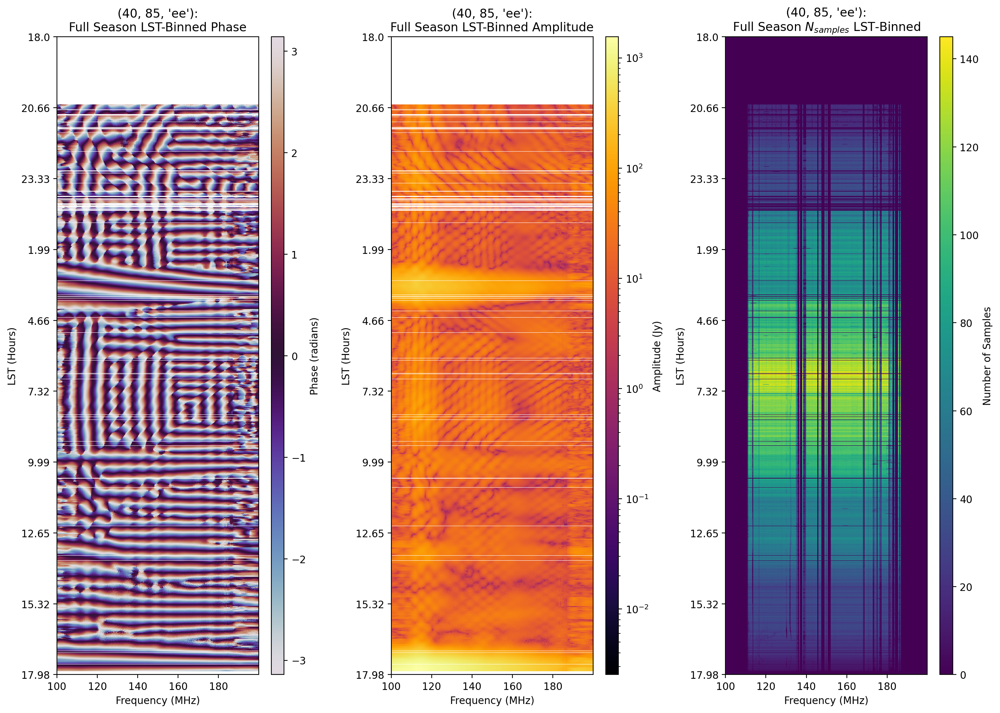

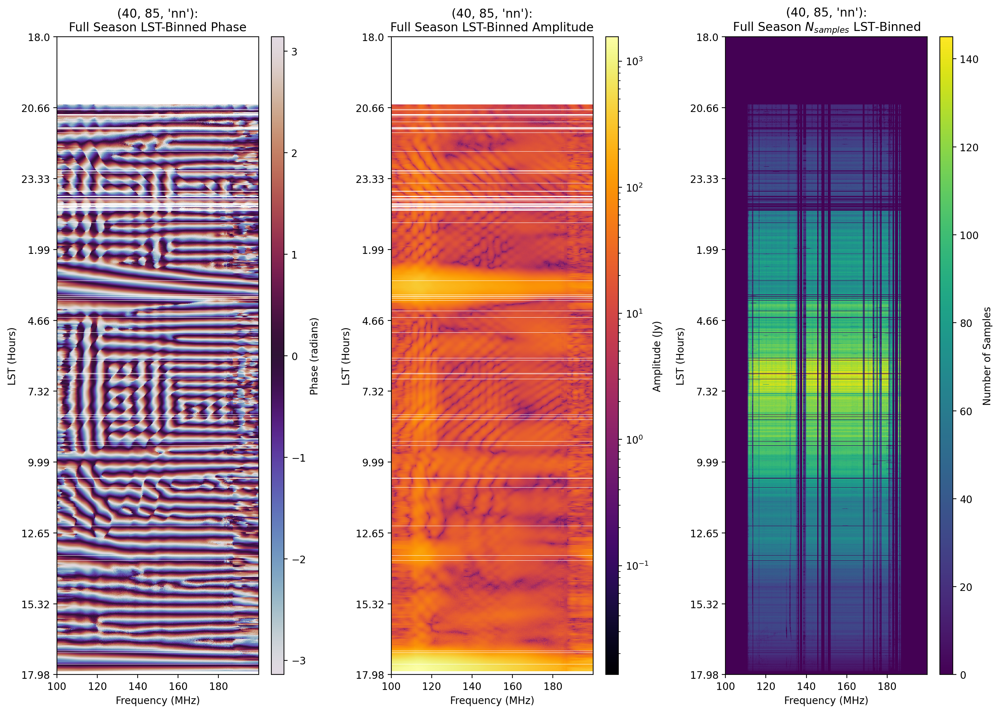

In [29]:
Plot_Full_Season()

In [22]:
def Full_Season_Count_Summary():
    fig, axes = plt.subplots(2, 1, figsize=(12,6), dpi=100)

    # Plot samples vs. freq
    nights_per_chan = np.nanmedian([np.where(np.all(nsamples_full[bl] == 0, axis=1)[:,np.newaxis], 
                                             np.nan, nsamples_full[bl]) / 2 for bl in bls_to_load], axis=(0,1))
    axes[0].plot(nsamples_full.freqs / 1e6, nights_per_chan)
    axes[0].set_ylabel('Median Nights Binned Per Channel')
    # configure and label x-axis
    axes[0].set_xlim([np.min(nsamples_full.freqs / 1e6), np.max(nsamples_full.freqs / 1e6)])
    axes[0].set_xticks(np.arange(np.min(nsamples_full.freqs / 1e6), np.max(nsamples_full.freqs / 1e6), 10))
    axes[0].set_xlabel('Frequency (MHz)')
    # configure and label channel axis
    ta = axes[0].twiny()
    ta.set_xlim([0, len(nsamples_full.freqs)])
    ta.set_xticks(np.arange(0, len(nsamples_full.freqs), 100))
    ta.set_xlabel('Channel')

    # Plot samples vs. lst
    nights_per_lst = np.nanmedian([np.where(np.all(nsamples_full[bl] == 0, axis=0)[np.newaxis, :], 
                                            np.nan, nsamples_full[bl]) / 2 for bl in bls_to_load], axis=(0,2))
    axes[1].plot(nsamples_full.lsts[nsamples_full.lsts > 4.71] * 12 / np.pi, nights_per_lst[nsamples_full.lsts > 4.71])
    axes[1].plot(nsamples_full.lsts[nsamples_full.lsts < 4.71] * 12 / np.pi, nights_per_lst[nsamples_full.lsts < 4.71], c='C0')
    axes[1].set_ylabel('Median Nights Binned Per LST')
    axes[1].set_xlim([0, 24])
    axes[1].set_xticks(np.arange(0, 25))
    axes[1].set_yticks(np.arange(0, np.max(nights_per_lst), 10))
    axes[1].set_xlabel('LST (Hours)')

    plt.tight_layout()

# Figure 5: Full Season Summary

Median number of nights binned together as a function of LST and frequency for the baseline above.

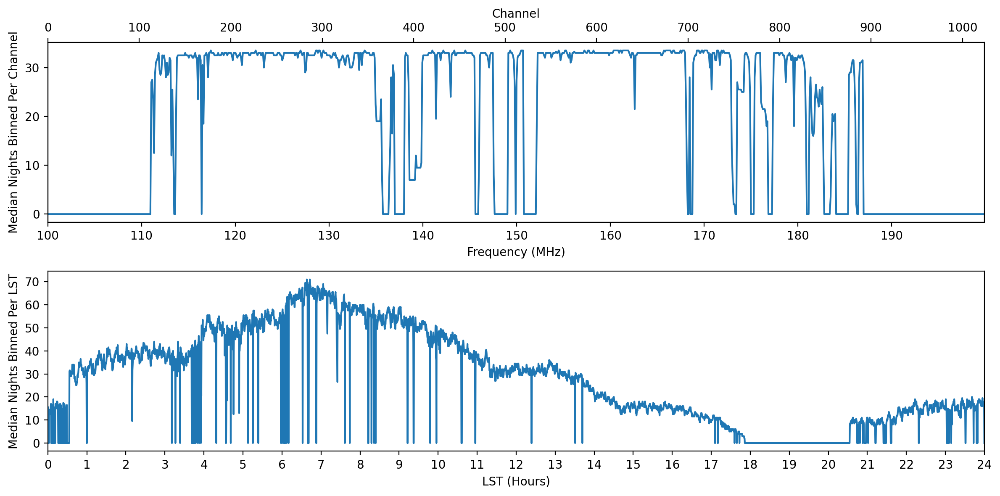

In [23]:
Full_Season_Count_Summary()

# Metadata

In [24]:
print(lstbin.version.history_string())


------------
This file was produced by the function <module>() in 33712492.py using: 
    git_branch: main
    git_description: v3.0-1691-gf183e17b
    git_hash: f183e17b87835f421dae9ae8932a5b4ca4919c16
    git_origin: git@github.com:HERA-Team/hera_cal.git
    version: 3.0
------------

